# 🥵 Prédire les probabilités d'avoir un match entre deux individus

# 🙉🙈 🙊 Quel est notre objectif ?

Notre objectif est de définir les caractéristiques importantes selon le sexe et par la suite de déterminer les chances que deux individus se plaisent.

# Pourquoi ce sujet ?
Nous voulons comprendre comment fonctionne les décisions et les points importants qui construisent une décision de match ou pas avec une personne.

# 💾 **Les données**

1. `id` Notre ID
2. `age` L'âge de la personne
3. `gender` (0 = Female, 1 = Male)
4. `pid` l'ID de notre vis à vis
5. `match` Est-ce qu'on a tous les deux matchs ?
6. `decision other` Quelle est la décision de notre vis à vis ?
7. `race` Notre origine ethnique :
    * Black/African American=1
	* European/Caucasian-American=2
	* Latino/Hispanic American=3
	* Asian/Pacific Islander/Asian-American=4
	* Native American=5
	* Other=6


8. `preference other attractive` Importance de l'attractivité 
9. `preference other sincerity` Importance de la sincérité
10. `preference other intelligence` Importance de l'intelligence
11. `preference other fun` Importance d'être fun
12. `preference other ambitious` Importance d'être ambitieux
13. `importance race` Importance d'avoir les mêmes origines ethniques
14. `importance religion` Importance d'avoir la même religion

15. `imo importance attractivity` Mon avis sur l'importance de l'attractivité 
16. `imo importance sincerity`  Mon avis sur l'importance de la sincérité
17. `imo importance fun`  Mon avis sur l'importance du fun
18. `imo importance intelligence`  Mon avis sur l'importance de l'intelligence
19. `imo importance ambitions`  Mon avis sur l'importance de l'ambition
20. `imo importance shared interest`  Mon avis sur l'importance des intérêts communs

21. `guess attractivity importance opposite sex` Ce que j'imagine comme importance de l'attractivité pour l'autre sexe
22. `guess sincerity importance  opposite sex` Ce que j'imagine comme importance de la sincérité pour l'autre sexe
23. `guess intelligence importance  opposite sex`  Ce que j'imagine comme importance de l'intelligence pour l'autre sexe
24. `guess fun importance  opposite sex`  Ce que j'imagine comme importance du fun pour l'autre sexe
25. `guess ambitions importance  opposite sex`  Ce que j'imagine comme importance de l'ambition pour l'autre sexe
26. `guess shared interest importance  opposite sex`  Ce que j'imagine comme importance des intérêts commun pour l'autre sexe

27. `sport_importance` L'importance du sport (tvsport, excersice, sport, hiking) 
28. `culture` L'importance de la culture (museums, art, reading, theater, music)
29. `fun` L'importance du fun ^^ (clubbing, movies, dining, concerts, shopping)              

# Etapes préliminaires : import package, data, nettoyage de données

In [1]:
import pandas as pd
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import hvplot.pandas
from scipy import stats
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

In [2]:
data = pd.read_excel('C:/Users/Flo/Downloads/data_SD.xlsx')

In [3]:
data.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1.0,0,1,1,1,10,7,NaN,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN


In [4]:
data.loc[data.reading>10]=10

In [5]:
data = data[data["gender"]<=1]

In [6]:
df = data[['id','age','gender','pid','match','dec_o','race','age_o','race_o','pf_o_att','pf_o_sin','pf_o_int',
             'pf_o_fun','pf_o_amb','pf_o_sha','imprace','imprelig','sports','tvsports','exercise','hiking',
             'museums','art','reading','theater','music','clubbing','movies','concerts','shopping','dining',
          'attr1_1','sinc1_1','intel1_1','fun1_1','amb1_1','shar1_1','field','attr2_1','sinc2_1',
           'intel2_1','fun2_1','amb2_1','shar2_1'

]]

In [7]:
df = df.rename(columns={"dec_o" : "decision other",
                   "age_o" : "age other",
                   "race_o" : "race other",
                   "pf_o_att" : "preference other attractive",
                   "pf_o_sin" : "preference other sincerity",
                   "pf_o_int" : "preference other intelligence",
                   "pf_o_fun" : "preference other fun",
                   "pf_o_amb" : "preference other ambitious",
                   "pf_o_sha" : "preference other shared interest",
                   "imprace" : "importance race",
                   "imprelig" : "importance religion",
                   "attr1_1" : "imo importance attractivity",
                   "sinc1_1" :"imo importance sincerity",
                   "intel1_1":"imo importance intelligence",
                   "fun1_1":"imo importance fun",
                   "amb1_1":"imo importance ambitions",
                   "shar1_1":"imo importance shared interest",
                   "attr2_1" : "guess attractivity importance opposite sex",
                   "sinc2_1" :"guess sincerity importance  opposite sex",
                   "intel2_1":"guess intelligence importance  opposite sex",
                   "fun2_1":"guess fun importance  opposite sex",
                   "amb2_1":"guess ambitions importance  opposite sex",
                   "shar2_1":"guess shared interest importance  opposite sex"
                   
                  })

In [8]:
df["sport_importance"] = (df["sports"]+df["tvsports"]+df["exercise"]+df["hiking"])/4

In [9]:
df = df.drop(["sports","tvsports","exercise","hiking"],axis=1)

In [10]:
df["culture"] = (df["museums"]+df["art"]+df["reading"]+df["theater"]+df["music"])/5

In [11]:
df = df.drop(["museums","art","reading","theater","music"],axis=1)

In [12]:
df["fun"] = (df["clubbing"]+df["movies"]+df["concerts"]+df["shopping"]+df["dining"])/5

In [13]:
df = df.drop(["clubbing","movies","concerts","shopping","dining"],axis=1)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8327 entries, 0 to 8377
Data columns (total 33 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   id                                              8326 non-null   float64
 1   age                                             8232 non-null   float64
 2   gender                                          8327 non-null   int64  
 3   pid                                             8317 non-null   float64
 4   match                                           8327 non-null   int64  
 5   decision other                                  8327 non-null   int64  
 6   race                                            8264 non-null   float64
 7   age other                                       8223 non-null   float64
 8   race other                                      8254 non-null   float64
 9   preference other attractive              

In [15]:
pd.set_option("display.float", "{:.1f}".format)
df.describe()

,id,age,gender,pid,match,decision other,race,age other,race other,preference other attractive,...,imo importance shared interest,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun
count,8326.0,8232.0,8327.0,8317.0,8327.0,8327.0,8264.0,8223.0,8254.0,8238.0,...,8177.0,8219.0,8219.0,8219.0,8219.0,8209.0,8209.0,8219.0,8219.0,8219.0
mean,9.0,26.4,0.5,283.4,0.2,0.4,2.8,26.4,2.8,22.5,...,11.8,30.5,13.2,14.4,18.4,11.7,11.8,5.8,7.2,6.8
std,5.5,3.6,0.5,158.5,0.4,0.5,1.2,3.6,1.2,12.6,...,6.4,16.3,7.0,6.3,6.6,6.9,6.2,1.7,1.5,1.3
min,1.0,18.0,0.0,1.0,0.0,0.0,1.0,18.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.8,1.4
25%,4.0,24.0,0.0,154.0,0.0,0.0,2.0,24.0,2.0,15.0,...,8.5,20.0,10.0,10.0,15.0,6.0,10.0,4.5,6.4,6.0
50%,8.0,26.0,1.0,281.0,0.0,0.0,2.0,26.0,2.0,20.0,...,10.3,25.0,14.6,15.0,20.0,10.0,10.0,5.8,7.4,7.0
75%,13.0,28.0,1.0,407.0,0.0,1.0,4.0,28.0,4.0,25.0,...,15.6,40.0,18.8,20.0,20.0,15.0,15.6,7.0,8.4,7.8
max,22.0,55.0,1.0,552.0,1.0,1.0,6.0,55.0,6.0,100.0,...,30.0,100.0,50.0,40.0,50.0,50.0,30.0,10.0,10.0,9.8


In [16]:
pd.set_option('display.max_columns', None)
df.head()

,id,age,gender,pid,match,decision other,race,age other,race other,preference other attractive,preference other sincerity,preference other intelligence,preference other fun,preference other ambitious,preference other shared interest,importance race,importance religion,imo importance attractivity,imo importance sincerity,imo importance intelligence,imo importance fun,imo importance ambitions,imo importance shared interest,field,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun
0,1.0,21.0,0,11.0,0,0,4.0,27.0,2.0,35.0,20.0,20.0,20.0,0.0,5.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
1,1.0,21.0,0,12.0,0,0,4.0,22.0,2.0,60.0,0.0,0.0,40.0,0.0,0.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
2,1.0,21.0,0,13.0,1,1,4.0,22.0,4.0,19.0,18.0,19.0,18.0,14.0,12.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
3,1.0,21.0,0,14.0,1,1,4.0,23.0,2.0,30.0,5.0,15.0,40.0,5.0,5.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
4,1.0,21.0,0,15.0,1,1,4.0,24.0,3.0,30.0,10.0,20.0,10.0,10.0,20.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4


<AxesSubplot:>

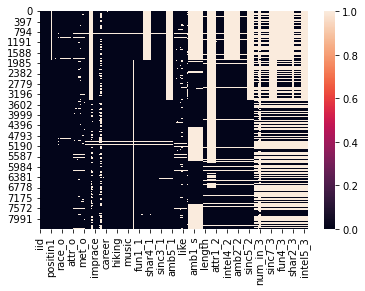

In [17]:
sns.heatmap(data.isnull())

In [18]:
df.isna().sum()

id                                                  1
age                                                95
gender                                              0
pid                                                10
match                                               0
decision other                                      0
race                                               63
age other                                         104
race other                                         73
preference other attractive                        89
preference other sincerity                         89
preference other intelligence                      89
preference other fun                               98
preference other ambitious                        107
preference other shared interest                  129
importance race                                    79
importance religion                                79
imo importance attractivity                       108
imo importance sincerity    

On va supprimer toutes les lignes avec des NA faire notre étude proprement. On peut se permettre cela car il nous restera assez de données après.

In [19]:
df = df.dropna()

In [20]:
df.isna().sum()

id                                                0
age                                               0
gender                                            0
pid                                               0
match                                             0
decision other                                    0
race                                              0
age other                                         0
race other                                        0
preference other attractive                       0
preference other sincerity                        0
preference other intelligence                     0
preference other fun                              0
preference other ambitious                        0
preference other shared interest                  0
importance race                                   0
importance religion                               0
imo importance attractivity                       0
imo importance sincerity                          0
imo importan

In [21]:
df.describe()

,id,age,gender,pid,match,decision other,race,age other,race other,preference other attractive,preference other sincerity,preference other intelligence,preference other fun,preference other ambitious,preference other shared interest,importance race,importance religion,imo importance attractivity,imo importance sincerity,imo importance intelligence,imo importance fun,imo importance ambitions,imo importance shared interest,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun
count,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0
mean,9.0,26.4,0.5,282.7,0.2,0.4,2.8,26.4,2.8,22.3,17.4,20.3,17.4,10.7,11.9,3.8,3.7,22.4,17.4,20.3,17.4,10.7,11.8,30.3,13.2,14.4,18.4,11.8,11.9,5.8,7.2,6.8
std,5.5,3.6,0.5,157.0,0.4,0.5,1.2,3.6,1.2,12.4,7.0,6.8,6.1,6.1,6.4,2.8,2.8,12.4,7.0,6.8,6.1,6.1,6.3,16.2,6.9,6.2,6.6,6.9,6.2,1.7,1.4,1.3
min,1.0,18.0,0.0,1.0,0.0,0.0,1.0,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.8,1.4
25%,4.0,24.0,0.0,156.0,0.0,0.0,2.0,24.0,2.0,15.0,15.0,17.4,15.0,5.0,9.5,1.0,1.0,15.0,15.0,17.4,15.0,5.0,9.1,20.0,10.0,10.0,15.0,5.0,10.0,4.5,6.4,6.0
50%,8.0,26.0,0.0,280.0,0.0,0.0,2.0,26.0,2.0,20.0,18.4,20.0,18.0,10.0,10.6,3.0,3.0,20.0,18.2,20.0,18.0,10.0,10.3,25.0,14.6,15.0,20.0,10.0,10.0,5.8,7.4,7.0
75%,13.0,28.0,1.0,406.0,0.0,1.0,4.0,28.0,4.0,25.0,20.0,23.8,20.0,15.0,16.0,6.0,6.0,25.0,20.0,23.8,20.0,15.0,15.7,40.0,18.5,20.0,20.0,15.0,15.6,7.0,8.4,7.8
max,22.0,55.0,1.0,552.0,1.0,1.0,6.0,55.0,6.0,100.0,60.0,50.0,50.0,53.0,30.0,10.0,10.0,100.0,60.0,50.0,50.0,53.0,30.0,100.0,50.0,40.0,50.0,50.0,30.0,10.0,10.0,9.8


In [22]:
df = df[df["decision other"]<=1]

In [23]:
df.describe()

,id,age,gender,pid,match,decision other,race,age other,race other,preference other attractive,preference other sincerity,preference other intelligence,preference other fun,preference other ambitious,preference other shared interest,importance race,importance religion,imo importance attractivity,imo importance sincerity,imo importance intelligence,imo importance fun,imo importance ambitions,imo importance shared interest,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun
count,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0,8005.0
mean,9.0,26.4,0.5,282.7,0.2,0.4,2.8,26.4,2.8,22.3,17.4,20.3,17.4,10.7,11.9,3.8,3.7,22.4,17.4,20.3,17.4,10.7,11.8,30.3,13.2,14.4,18.4,11.8,11.9,5.8,7.2,6.8
std,5.5,3.6,0.5,157.0,0.4,0.5,1.2,3.6,1.2,12.4,7.0,6.8,6.1,6.1,6.4,2.8,2.8,12.4,7.0,6.8,6.1,6.1,6.3,16.2,6.9,6.2,6.6,6.9,6.2,1.7,1.4,1.3
min,1.0,18.0,0.0,1.0,0.0,0.0,1.0,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.8,1.4
25%,4.0,24.0,0.0,156.0,0.0,0.0,2.0,24.0,2.0,15.0,15.0,17.4,15.0,5.0,9.5,1.0,1.0,15.0,15.0,17.4,15.0,5.0,9.1,20.0,10.0,10.0,15.0,5.0,10.0,4.5,6.4,6.0
50%,8.0,26.0,0.0,280.0,0.0,0.0,2.0,26.0,2.0,20.0,18.4,20.0,18.0,10.0,10.6,3.0,3.0,20.0,18.2,20.0,18.0,10.0,10.3,25.0,14.6,15.0,20.0,10.0,10.0,5.8,7.4,7.0
75%,13.0,28.0,1.0,406.0,0.0,1.0,4.0,28.0,4.0,25.0,20.0,23.8,20.0,15.0,16.0,6.0,6.0,25.0,20.0,23.8,20.0,15.0,15.7,40.0,18.5,20.0,20.0,15.0,15.6,7.0,8.4,7.8
max,22.0,55.0,1.0,552.0,1.0,1.0,6.0,55.0,6.0,100.0,60.0,50.0,50.0,53.0,30.0,10.0,10.0,100.0,60.0,50.0,50.0,53.0,30.0,100.0,50.0,40.0,50.0,50.0,30.0,10.0,10.0,9.8


In [24]:
df["decision other"].value_counts()

0    4613
1    3392
Name: decision other, dtype: int64

# Statistiques descriptives


In [25]:
labels = {1:'male', 0:'female'}

fig = px.pie(df,names=df['gender'].map(labels),color_discrete_sequence=["red", "blue"])
fig.show()

> Répartition parfaite entre homme et femme

In [26]:
labels = {1:'male', 0:'female'}
fig = px.histogram(df, x="age", color=df['gender'].map(labels),color_discrete_sequence=["red", "blue"])
fig.show()

> L'âge des participants

C:\Users\Flo\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Flo\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Flo\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\Flo\anaconda3\lib\site-packages\se

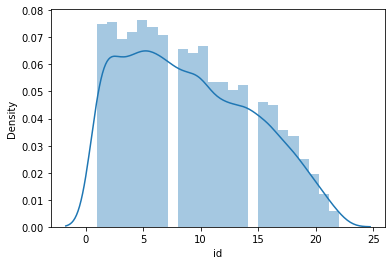

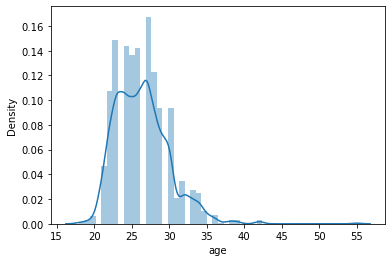

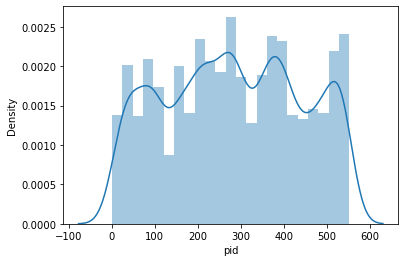

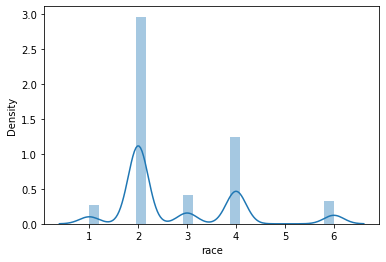

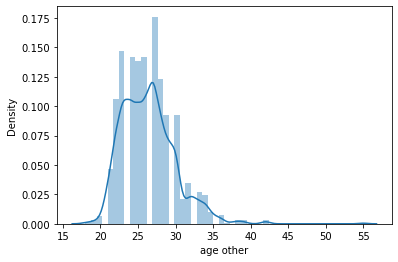

...

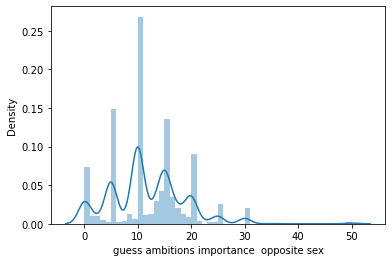

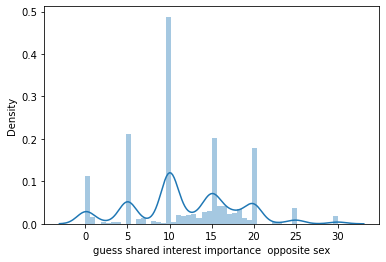

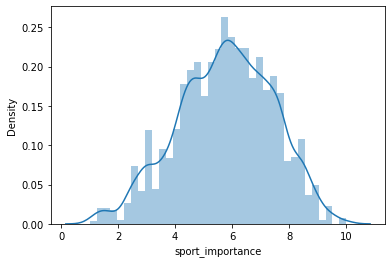

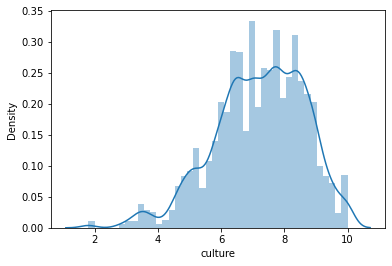

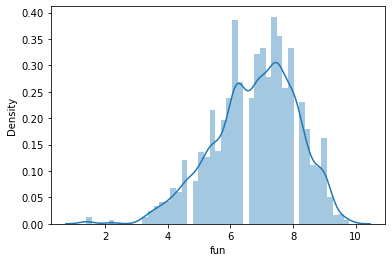

In [27]:
for col in df.select_dtypes('float'):
    plt.figure()
    sns.distplot(df[col])

> fonction de densité

(32.5, -0.5)

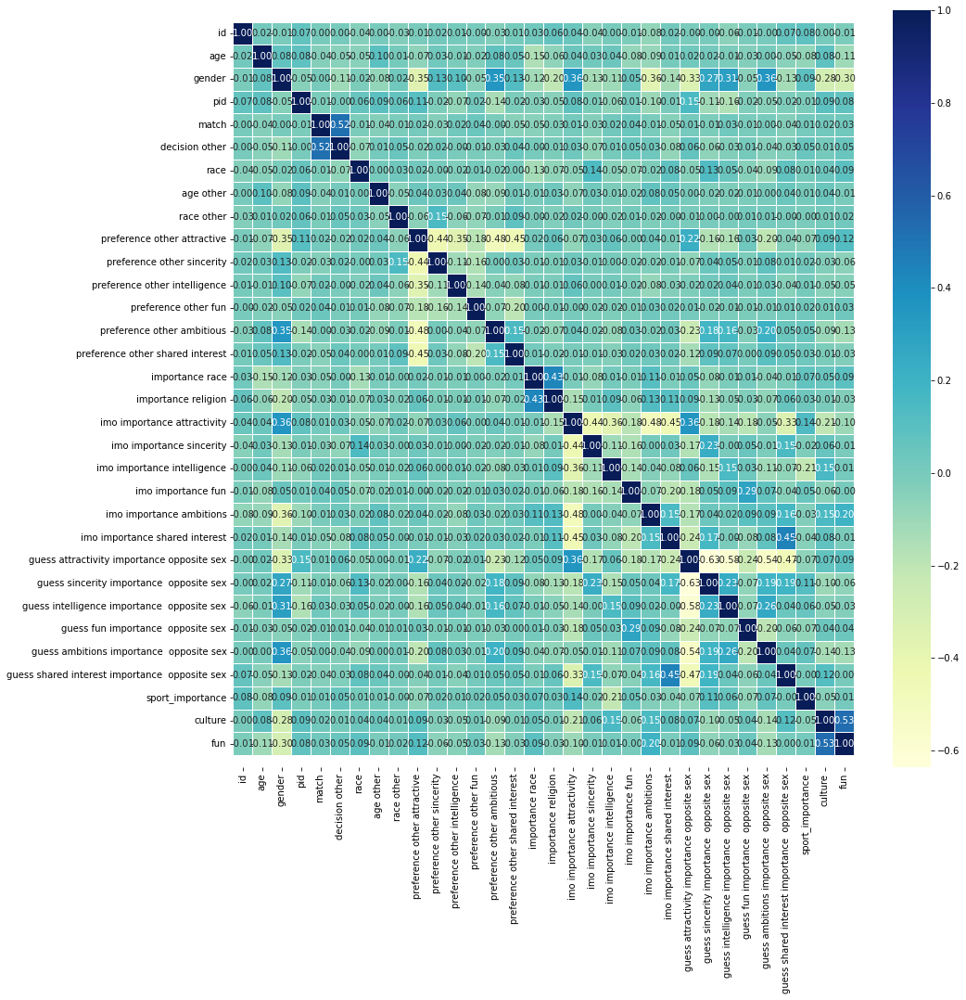

In [28]:
# Let's make our correlation matrix a little prettier
corr_matrix = df.corr()
fig, ax = plt.subplots(figsize=(15, 15))
ax = sns.heatmap(corr_matrix,
                 annot=True,
                 linewidths=0.5,
                 fmt=".2f",
                 cmap="YlGnBu");
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [29]:
atributes_gender = data[['gender','attr1_1', 'sinc1_1','intel1_1','fun1_1','amb1_1','shar1_1']].groupby('gender').mean()
cols = ['Attractive','Sincere','Intelligente','Fun','Ambituous','Shared Interests']
atributes_gender.columns = cols

In [30]:
trace1 = go.Bar(
    y=list(atributes_gender.iloc[1]),
    x=atributes_gender.columns.values,
    name='Men',
    marker=dict(
        color='blue'
    )
)
trace2 = go.Bar(
    y=list(atributes_gender.iloc[0]),
    x=atributes_gender.columns.values,
    name='Women',
    marker=dict(
        color='red'
    )
)

data1 = [trace1, trace2]
layout = go.Layout(
    title='Ce que les gens cherchent dans le sexe opposé',
    font=dict(
        size=16
    ),
    legend=dict(
        font=dict(
            size=16
        )
    )
)
fig = go.Figure(data=data1, layout=layout)
py.iplot(fig, filename='barchart')


> Les hommes se concentrent plus sur le physique alors que les femmes cherchent de l'intelligence et de la sincérité

In [31]:
atributes_gender_2 = data[['gender','attr2_1', 'sinc2_1','intel2_1','fun2_1','amb2_1','shar2_1']].groupby('gender').mean()
atributes_gender_2.columns = cols

In [32]:
trace1 = go.Bar(
    y=list(atributes_gender_2.iloc[1]),
    x=atributes_gender.columns.values,
    name='Men',
    marker=dict(
        color='blue'
    )
)
trace2 = go.Bar(
    y=list(atributes_gender_2.iloc[0]),
    x=atributes_gender.columns.values,
    name='Women',
    marker=dict(
        color='red'
    )
)

data2 = [trace1, trace2]
layout = go.Layout(
    title='Ce que les gens pensent que le sexe opposé cherche',
    font=dict(
        size=16
    ),
    legend=dict(
        font=dict(
            size=16
        )
    )
)
fig = go.Figure(data=data2, layout=layout)
py.iplot(fig, filename='barchart')

> Les femmes ont bien cernés les hommes

In [33]:
labels = {1:'male', 0:'female'}
fig = px.histogram(data,histfunc="count", x="imprace", y="id",
             color=data["gender"].map(labels),color_discrete_sequence=["red", "blue"], barmode='group')
fig.show()

> L'ethnie n'est pas importante

In [34]:
labels = {1:'male', 0:'female'}
fig = px.histogram(data,histfunc="count", x="imprelig", y="id",
             color=data["gender"].map(labels),color_discrete_sequence=["red", "blue"], barmode='group')
fig.show()

> De même pour la religion

In [35]:
df

,id,age,gender,pid,match,decision other,race,age other,race other,preference other attractive,preference other sincerity,preference other intelligence,preference other fun,preference other ambitious,preference other shared interest,importance race,importance religion,imo importance attractivity,imo importance sincerity,imo importance intelligence,imo importance fun,imo importance ambitions,imo importance shared interest,field,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun
0,1.0,21.0,0,11.0,0,0,4.0,27.0,2.0,35.0,20.0,20.0,20.0,0.0,5.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
1,1.0,21.0,0,12.0,0,0,4.0,22.0,2.0,60.0,0.0,0.0,40.0,0.0,0.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
2,1.0,21.0,0,13.0,1,1,4.0,22.0,4.0,19.0,18.0,19.0,18.0,14.0,12.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
3,1.0,21.0,0,14.0,1,1,4.0,23.0,2.0,30.0,5.0,15.0,40.0,5.0,5.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
4,1.0,21.0,0,15.0,1,1,4.0,24.0,3.0,30.0,10.0,20.0,10.0,10.0,20.0,2.0,4.0,15.0,20.0,20.0,15.0,15.0,15.0,Law,35.0,20.0,15.0,20.0,5.0,5.0,6.0,3.6,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8371,22.0,25.0,1,524.0,1,1,2.0,25.0,4.0,15.0,20.0,25.0,20.0,10.0,10.0,1.0,1.0,70.0,0.0,15.0,15.0,0.0,0.0,Climate Dynamics,50.0,0.0,0.0,30.0,0.0,20.0,5.5,9.0,9.0
8372,22.0,25.0,1,525.0,0,0,2.0,24.0,2.0,10.0,15.0,30.0,20.0,15.0,10.0,1.0,1.0,70.0,0.0,15.0,15.0,0.0,0.0,Climate Dynamics,50.0,0.0,0.0,30.0,0.0,20.0,5.5,9.0,9.0
8373,22.0,25.0,1,526.0,0,1,2.0,26.0,3.0,10.0,10.0,30.0,20.0,10.0,15.0,1.0,1.0,70.0,0.0,15.0,15.0,0.0,0.0,Climate Dynamics,50.0,0.0,0.0,30.0,0.0,20.0,5.5,9.0,9.0
8374,22.0,25.0,1,527.0,0,0,2.0,24.0,6.0,50.0,20.0,10.0,5.0,10.0,5.0,1.0,1.0,70.0,0.0,15.0,15.0,0.0,0.0,Climate Dynamics,50.0,0.0,0.0,30.0,0.0,20.0,5.5,9.0,9.0


In [36]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [37]:
from sklearn.model_selection import train_test_split
df = df.drop('id',axis=1)
df = df.drop('pid',axis=1)
df = df.drop('field',axis=1)
df = df.drop('match',axis=1)
df = df.drop('gender',axis=1)

X = df.drop('decision other', axis=1)
y = df["decision other"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## 1. Logistic Regression

In [38]:
from sklearn.linear_model import LogisticRegression

lr_clf = LogisticRegression(solver='liblinear')
lr_clf.fit(X_train, y_train)

print_score(lr_clf, X_train, y_train, X_test, y_test, train=True)
print_score(lr_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 59.52%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.5       0.6        0.6           0.6
recall       0.8    0.3       0.6        0.6           0.6
f1-score     0.7    0.4       0.6        0.5           0.6
support   3230.0 2373.0       0.6     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[2706  524]
 [1744  629]]

Test Result:
Accuracy Score: 57.49%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.5       0.6        0.5           0.6
recall       0.8    0.2       0.6        0.5           0.6
f1-score     0.7    0.3       0.6        0.5           0.5
support   1383.0 1019.0       0.6     2402.0        2402.0
_______________________________________________
Confusion Matrix: 
 [[1150  233]
 [ 788  231]]



In [39]:
test_score = accuracy_score(y_test, lr_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, lr_clf.predict(X_train)) * 100

results_df = pd.DataFrame(data=[["Logistic Regression", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,59.5,57.5


## 2. K-nearest neighbors

In [40]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier()
knn_clf.fit(X_train, y_train)

print_score(knn_clf, X_train, y_train, X_test, y_test, train=True)
print_score(knn_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 75.35%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.8    0.7       0.8        0.8           0.8
recall       0.8    0.7       0.8        0.7           0.8
f1-score     0.8    0.7       0.8        0.7           0.8
support   3230.0 2373.0       0.8     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[2678  552]
 [ 829 1544]]

Test Result:
Accuracy Score: 61.32%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.7    0.6       0.6        0.6           0.6
recall       0.7    0.5       0.6        0.6           0.6
f1-score     0.7    0.5       0.6        0.6           0.6
support   1383.0 1019.0       0.6     2402.0        2402.0
_______________________________________________
Confusion Matrix: 
 [[979 404]
 [525 494]]



In [41]:
test_score = accuracy_score(y_test, knn_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, knn_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["K-nearest neighbors", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,59.5,57.5
1,K-nearest neighbors,75.4,61.3


## 3. Support Vector machine

In [42]:
from sklearn.svm import SVC


svm_clf = SVC(kernel='rbf', gamma=0.1, C=1.0)
svm_clf.fit(X_train, y_train)

print_score(svm_clf, X_train, y_train, X_test, y_test, train=True)
print_score(svm_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 99.89%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support   3230.0 2373.0       1.0     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[3230    0]
 [   6 2367]]

Test Result:
Accuracy Score: 57.74%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.6       0.6        0.6           0.6
recall       1.0    0.0       0.6        0.5           0.6
f1-score     0.7    0.0       0.6        0.4           0.4
support   1383.0 1019.0       0.6     2402.0        2402.0
_______________________________________________
Confusion Matrix: 
 [[1372   11]
 [1004   15]]



In [43]:
test_score = accuracy_score(y_test, svm_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, svm_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Support Vector Machine", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,59.5,57.5
1,K-nearest neighbors,75.4,61.3
2,Support Vector Machine,99.9,57.7


## 4. Decision Tree Classifier 

In [44]:
from sklearn.tree import DecisionTreeClassifier


tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support   3230.0 2373.0       1.0     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[3230    0]
 [   0 2373]]

Test Result:
Accuracy Score: 58.78%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.5       0.6        0.6           0.6
recall       0.6    0.5       0.6        0.6           0.6
f1-score     0.6    0.5       0.6        0.6           0.6
support   1383.0 1019.0       0.6     2402.0        2402.0
_______________________________________________
Confusion Matrix: 
 [[864 519]
 [471 548]]



In [45]:
test_score = accuracy_score(y_test, tree_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, tree_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Decision Tree Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,59.5,57.5
1,K-nearest neighbors,75.4,61.3
2,Support Vector Machine,99.9,57.7
3,Decision Tree Classifier,100.0,58.8


## 5. Random Forest

In [46]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

rf_clf = RandomForestClassifier(n_estimators=1000, random_state=42)
rf_clf.fit(X_train, y_train)

print_score(rf_clf, X_train, y_train, X_test, y_test, train=True)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 100.00%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support   3230.0 2373.0       1.0     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[3230    0]
 [   0 2373]]

Test Result:
Accuracy Score: 64.82%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.7    0.6       0.6        0.6           0.6
recall       0.8    0.5       0.6        0.6           0.6
f1-score     0.7    0.5       0.6        0.6           0.6
support   1383.0 1019.0       0.6     2402.0        2402.0
_______________________________________________
Confusion Matrix: 
 [[1047  336]
 [ 509  510]]



In [47]:
test_score = accuracy_score(y_test, rf_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, rf_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Random Forest Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,59.5,57.5
1,K-nearest neighbors,75.4,61.3
2,Support Vector Machine,99.9,57.7
3,Decision Tree Classifier,100.0,58.8
4,Random Forest Classifier,100.0,64.8


## 6. XGBoost Classifer

In [48]:
from xgboost import XGBClassifier

xgb_clf = XGBClassifier(use_label_encoder=False)
xgb_clf.fit(X_train, y_train)

print_score(xgb_clf, X_train, y_train, X_test, y_test, train=True)
print_score(xgb_clf, X_train, y_train, X_test, y_test, train=False)

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.



Train Result:
Accuracy Score: 97.11%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support   3230.0 2373.0       1.0     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[3167   63]
 [  99 2274]]

Test Result:
Accuracy Score: 68.61%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.7    0.6       0.7        0.7           0.7
recall       0.8    0.6       0.7        0.7           0.7
f1-score     0.7    0.6       0.7        0.7           0.7
support   1383.0 1019.0       0.7     2402.0        2402.0
_______________________________________________
Confusion Matrix: 
 [[1061  322]
 [ 432  587]]



In [49]:
test_score = accuracy_score(y_test, xgb_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, xgb_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["XGBoost Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,59.5,57.5
1,K-nearest neighbors,75.4,61.3
2,Support Vector Machine,99.9,57.7
3,Decision Tree Classifier,100.0,58.8
4,Random Forest Classifier,100.0,64.8
5,XGBoost Classifier,97.1,68.6


# Cross Validation pour nos meilleurs modèles

In [50]:
from sklearn.datasets import load_iris
from sklearn.model_selection import cross_val_score,KFold
from sklearn.linear_model import LogisticRegression

In [51]:
kf=KFold(n_splits=5)
score=cross_val_score(xgb_clf,X,y,cv=kf)
print("Cross Validation Scores are {}".format(score))
print("Average Cross Validation score :{}".format(score.mean()))

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.



Cross Validation Scores are [0.54840725 0.56964397 0.57276702 0.54840725 0.59150531]
Average Cross Validation score :0.5661461586508432


In [52]:
kf=KFold(n_splits=5)
score=cross_val_score(rf_clf,X,y,cv=kf)
print("Cross Validation Scores are {}".format(score))
print("Average Cross Validation score :{}".format(score.mean()))

Cross Validation Scores are [0.59025609 0.55965022 0.59025609 0.55277951 0.59025609]
Average Cross Validation score :0.5766396002498438


## 1. Logistic Regression Hyperparameter Tuning

In [53]:
from sklearn.model_selection import GridSearchCV

params = {"C": np.logspace(-4, 4, 20),
          "solver": ["liblinear"]}

lr_clf = LogisticRegression()

lr_cv = GridSearchCV(lr_clf, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=5)
lr_cv.fit(X_train, y_train)
best_params = lr_cv.best_params_
print(f"Best parameters: {best_params}")
lr_clf = LogisticRegression(**best_params)

lr_clf.fit(X_train, y_train)

print_score(lr_clf, X_train, y_train, X_test, y_test, train=True)
print_score(lr_clf, X_train, y_train, X_test, y_test, train=False)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters: {'C': 0.03359818286283781, 'solver': 'liblinear'}
Train Result:
Accuracy Score: 59.45%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.5       0.6        0.6           0.6
recall       0.8    0.3       0.6        0.6           0.6
f1-score     0.7    0.4       0.6        0.5           0.6
support   3230.0 2373.0       0.6     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[2711  519]
 [1753  620]]

Test Result:
Accuracy Score: 57.62%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.5       0.6        0.5           0.6
recall       0.8    0.2       0.6        0.5           0.6
f1-score     0.7    0.3       0.6        0.5           0.5
support   1383.0 1019.0      

In [54]:
test_score = accuracy_score(y_test, lr_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, lr_clf.predict(X_train)) * 100

tuning_results_df = pd.DataFrame(data=[["Tuned Logistic Regression", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,59.5,57.6


## 2. K-nearest neighbors Hyperparameter Tuning

In [55]:
train_score = []
test_score = []
neighbors = range(1, 30)

for k in neighbors:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    train_score.append(accuracy_score(y_train, model.predict(X_train)))
#     test_score.append(accuracy_score(y_test, model.predict(X_test)))

Maximum KNN score on the test data: 100.00%


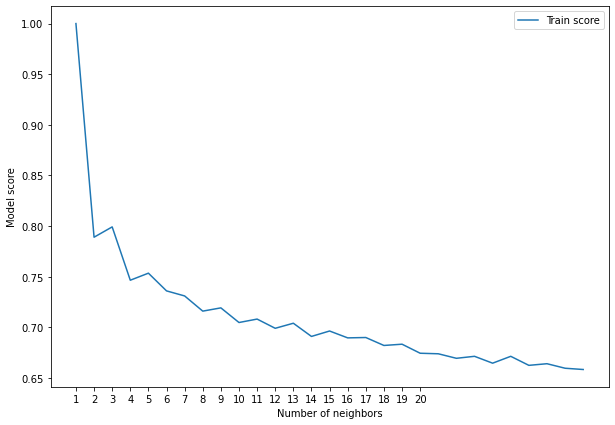

In [56]:
plt.figure(figsize=(10, 7))

plt.plot(neighbors, train_score, label="Train score")
# plt.plot(neighbors, test_score, label="Test score")
plt.xticks(np.arange(1, 21, 1))
plt.xlabel("Number of neighbors")
plt.ylabel("Model score")
plt.legend()

print(f"Maximum KNN score on the test data: {max(train_score)*100:.2f}%")

In [57]:
knn_clf = KNeighborsClassifier(n_neighbors=4)
knn_clf.fit(X_train, y_train)

print_score(knn_clf, X_train, y_train, X_test, y_test, train=True)
print_score(knn_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 74.66%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.7    0.8       0.7        0.8           0.8
recall       0.9    0.5       0.7        0.7           0.7
f1-score     0.8    0.6       0.7        0.7           0.7
support   3230.0 2373.0       0.7     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[2988  242]
 [1178 1195]]

Test Result:
Accuracy Score: 62.99%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.6       0.6        0.6           0.6
recall       0.8    0.4       0.6        0.6           0.6
f1-score     0.7    0.5       0.6        0.6           0.6
support   1383.0 1019.0       0.6     2402.0        2402.0
_______________________________________________
Confusion Matrix: 
 [[1139  244]
 [ 645  374]]



In [58]:
test_score = accuracy_score(y_test, knn_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, knn_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned K-nearest neighbors", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,59.5,57.6
1,Tuned K-nearest neighbors,74.7,63.0


## 3. Support Vector Machine Hyperparameter Tuning

In [59]:
svm_clf = SVC(kernel='rbf', C=1.0)

params = {"C":(0.1, 1, 10), 
          "kernel":('linear', 'poly', 'rbf')}

svm_cv = GridSearchCV(svm_clf, params, n_jobs=-1, cv=2, verbose=1, scoring="accuracy")
svm_cv.fit(X_train, y_train)
best_params = svm_cv.best_params_
print(f"Best params: {best_params}")

svm_clf = SVC(**best_params)
svm_clf.fit(X_train, y_train)

print_score(svm_clf, X_train, y_train, X_test, y_test, train=True)
print_score(svm_clf, X_train, y_train, X_test, y_test, train=False)

Fitting 2 folds for each of 9 candidates, totalling 18 fits
Best params: {'C': 10, 'kernel': 'rbf'}
Train Result:
Accuracy Score: 72.14%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.7    0.7       0.7        0.7           0.7
recall       0.9    0.5       0.7        0.7           0.7
f1-score     0.8    0.6       0.7        0.7           0.7
support   3230.0 2373.0       0.7     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[2818  412]
 [1149 1224]]

Test Result:
Accuracy Score: 61.28%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.6       0.6        0.6           0.6
recall       0.8    0.4       0.6        0.6           0.6
f1-score     0.7    0.5       0.6        0.6           0.6
support   1383.0 1019.0       0.6     2402.0        2402.0

In [60]:
test_score = accuracy_score(y_test, svm_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, svm_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Support Vector Machine", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,59.5,57.6
1,Tuned K-nearest neighbors,74.7,63.0
2,Tuned Support Vector Machine,72.1,61.3


## 4. Decision Tree Classifier Hyperparameter Tuning

In [61]:
params = {"criterion":("gini", "entropy"), 
          "splitter":("best", "random"), 
          "max_depth":(1,2,5,20), 
          }

tree_clf = DecisionTreeClassifier(random_state=42)
tree_cv = GridSearchCV(tree_clf, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=2)
tree_cv.fit(X_train, y_train)
best_params = tree_cv.best_params_
print(f'Best_params: {best_params}')

tree_clf = DecisionTreeClassifier(**best_params)
tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_train, y_train, X_test, y_test, train=True)
print_score(tree_clf, X_train, y_train, X_test, y_test, train=False)

Fitting 2 folds for each of 16 candidates, totalling 32 fits
Best_params: {'criterion': 'entropy', 'max_depth': 20, 'splitter': 'random'}
Train Result:
Accuracy Score: 89.08%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.9    0.9       0.9        0.9           0.9
recall       0.9    0.8       0.9        0.9           0.9
f1-score     0.9    0.9       0.9        0.9           0.9
support   3230.0 2373.0       0.9     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[3025  205]
 [ 407 1966]]

Test Result:
Accuracy Score: 59.37%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.6    0.5       0.6        0.6           0.6
recall       0.7    0.5       0.6        0.6           0.6
f1-score     0.7    0.5       0.6        0.6           0.6
support   1383.0 101

In [62]:
test_score = accuracy_score(y_test, tree_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, tree_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Decision Tree Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,59.5,57.6
1,Tuned K-nearest neighbors,74.7,63.0
2,Tuned Support Vector Machine,72.1,61.3
3,Tuned Decision Tree Classifier,89.1,59.4


## 5. Random Forest Classifier Hyperparameter Tuning

In [63]:
n_estimators = [100,200,400]
max_features = ['auto', 'sqrt']
max_depth = [2, 5, 10]

params_grid = {
    'n_estimators': n_estimators, 
    'max_features': max_features,
    'max_depth': max_depth
              }

rf_clf = RandomForestClassifier(random_state=42)
rf_cv = GridSearchCV(rf_clf, params_grid, scoring="accuracy", cv=10, verbose=1, n_jobs=-1)
rf_cv.fit(X_train, y_train)
best_params = rf_cv.best_params_
print(f"Best parameters: {best_params}")

rf_clf = RandomForestClassifier(**best_params)
rf_clf.fit(X_train, y_train)

print_score(rf_clf, X_train, y_train, X_test, y_test, train=True)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=False)

Fitting 10 folds for each of 18 candidates, totalling 180 fits
Best parameters: {'max_depth': 10, 'max_features': 'auto', 'n_estimators': 100}
Train Result:
Accuracy Score: 86.15%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.8    0.9       0.9        0.9           0.9
recall       1.0    0.7       0.9        0.8           0.9
f1-score     0.9    0.8       0.9        0.9           0.9
support   3230.0 2373.0       0.9     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[3085  145]
 [ 631 1742]]

Test Result:
Accuracy Score: 64.65%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.7    0.6       0.6        0.6           0.6
recall       0.8    0.4       0.6        0.6           0.6
f1-score     0.7    0.5       0.6        0.6           0.6
support   1383.

In [64]:
test_score = accuracy_score(y_test, rf_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, rf_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Random Forest Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,59.5,57.6
1,Tuned K-nearest neighbors,74.7,63.0
2,Tuned Support Vector Machine,72.1,61.3
3,Tuned Decision Tree Classifier,89.1,59.4
4,Tuned Random Forest Classifier,86.2,64.7


## 6. XGBoost Classifier Hyperparameter Tuning

In [65]:
dict_parms={"booster":["gbtree", "gblinear"],"nthread":[2,3,4,5]}

xgb_clf = XGBClassifier(use_label_encoder=False)
xgb_cv = RandomizedSearchCV(
    xgb_clf, dict_parms, cv=3, n_iter=50, 
    scoring='accuracy', n_jobs=-1, verbose=1
)
xgb_cv.fit(X_train, y_train)
best_params = xgb_cv.best_params_
print(f"Best paramters: {best_params}")

xgb_clf = XGBClassifier(**best_params)
xgb_clf.fit(X_train, y_train)

print_score(xgb_clf, X_train, y_train, X_test, y_test, train=True)
print_score(xgb_clf, X_train, y_train, X_test, y_test, train=False)

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.

C:\Users\Flo\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:285: UserWarning:

The total space of parameters 8 is smaller than n_iter=50. Running 8 iterations. For exhaustive searches, use GridSearchCV.

C:\Users\Flo\anaconda3\lib\site-packages\xgboost\sklearn.py:1421: UserWarning:

`use_label_encoder` is deprecated in 1.7.0.



Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best paramters: {'nthread': 2, 'booster': 'gbtree'}
Train Result:
Accuracy Score: 97.11%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    1.0    1.0       1.0        1.0           1.0
recall       1.0    1.0       1.0        1.0           1.0
f1-score     1.0    1.0       1.0        1.0           1.0
support   3230.0 2373.0       1.0     5603.0        5603.0
_______________________________________________
Confusion Matrix: 
 [[3167   63]
 [  99 2274]]

Test Result:
Accuracy Score: 68.61%
_______________________________________________
CLASSIFICATION REPORT:
               0      1  accuracy  macro avg  weighted avg
precision    0.7    0.6       0.7        0.7           0.7
recall       0.8    0.6       0.7        0.7           0.7
f1-score     0.7    0.6       0.7        0.7           0.7
support   1383.0 1019.0       0.7     2402.0  

In [66]:
test_score = accuracy_score(y_test, xgb_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, xgb_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned XGBoost Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,59.5,57.6
1,Tuned K-nearest neighbors,74.7,63.0
2,Tuned Support Vector Machine,72.1,61.3
3,Tuned Decision Tree Classifier,89.1,59.4
4,Tuned Random Forest Classifier,86.2,64.7
5,Tuned XGBoost Classifier,97.1,68.6


In [67]:
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,59.5,57.5
1,K-nearest neighbors,75.4,61.3
2,Support Vector Machine,99.9,57.7
3,Decision Tree Classifier,100.0,58.8
4,Random Forest Classifier,100.0,64.8
5,XGBoost Classifier,97.1,68.6


# 6. Features Importance According to Random Forest and XGBoost

In [68]:
def feature_imp(df, model):
    fi = pd.DataFrame()
    fi["feature"] = df.columns
    fi["importance"] = model.feature_importances_
    return fi.sort_values(by="importance", ascending=True)

<AxesSubplot:>

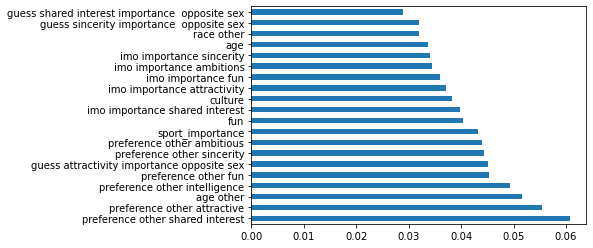

In [69]:
feat_importances = pd.Series(rf_clf.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')

<AxesSubplot:>

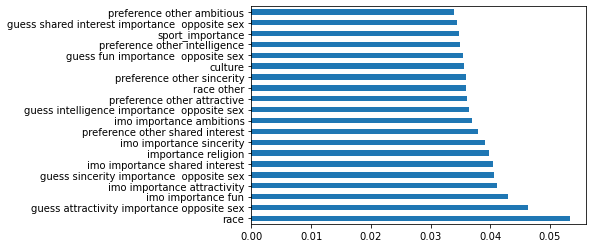

In [70]:
feat_importances = pd.Series(xgb_clf.feature_importances_, index=X.columns)
feat_importances.nlargest(20).plot(kind='barh')

In [71]:
proba_predite_xgb=xgb_clf.predict_proba(X_test)
classe_predite_xgb=xgb_clf.predict(X_test)

In [72]:
proba_one=[]

for i in range(len(proba_predite_xgb)):
  proba_one.append(proba_predite_xgb[i][1])

In [73]:
data_proba=pd.DataFrame(proba_one,columns=["Probabilité de plaire à l'autre"])
data_predict=pd.DataFrame(classe_predite_xgb,columns=["Choix de l'autre"])

In [74]:
data_proba

,Probabilité de plaire à l'autre
0,0.1
1,0.1
2,0.1
3,0.5
4,0.1
...,...
2397,0.1
2398,0.9
2399,0.0
2400,0.0


In [75]:
data_predict

,Choix de l'autre
0,0
1,0
2,0
3,0
4,0
...,...
2397,0
2398,1
2399,0
2400,0


In [76]:
X_test.reset_index()

,index,age,race,age other,race other,preference other attractive,preference other sincerity,preference other intelligence,preference other fun,preference other ambitious,preference other shared interest,importance race,importance religion,imo importance attractivity,imo importance sincerity,imo importance intelligence,imo importance fun,imo importance ambitions,imo importance shared interest,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun
0,7917,26.0,4.0,26.0,3.0,25.0,25.0,25.0,12.0,3.0,10.0,8.0,3.0,25.0,20.0,20.0,20.0,5.0,10.0,20.0,20.0,20.0,20.0,10.0,10.0,6.2,6.4,6.6
1,6543,27.0,4.0,30.0,2.0,40.0,12.0,18.0,12.0,6.0,12.0,5.0,8.0,15.0,15.0,25.0,15.0,15.0,15.0,50.0,10.0,10.0,10.0,10.0,10.0,9.0,9.4,7.4
2,7312,32.0,6.0,24.0,2.0,20.0,20.0,20.0,20.0,20.0,0.0,5.0,6.0,20.0,20.0,20.0,15.0,15.0,10.0,20.0,10.0,20.0,20.0,15.0,15.0,6.2,5.6,6.2
3,2235,26.0,2.0,24.0,2.0,11.4,18.2,22.7,18.2,11.4,18.2,1.0,1.0,12.0,20.0,20.0,20.0,16.0,12.0,14.3,14.3,14.3,23.8,14.3,19.1,3.5,7.2,3.4
4,5824,27.0,2.0,31.0,2.0,35.0,0.0,25.0,20.0,0.0,20.0,10.0,5.0,25.0,20.0,10.0,20.0,15.0,10.0,75.0,1.0,2.0,20.0,1.0,1.0,7.5,6.6,7.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2397,1557,22.0,3.0,30.0,2.0,20.0,25.0,15.0,15.0,15.0,10.0,1.0,3.0,10.0,20.0,35.0,10.0,5.0,20.0,20.0,15.0,20.0,20.0,5.0,20.0,3.0,7.0,5.4
2398,6326,27.0,2.0,25.0,2.0,25.0,20.0,20.0,20.0,10.0,5.0,8.0,8.0,20.0,20.0,20.0,20.0,10.0,10.0,30.0,10.0,10.0,20.0,10.0,10.0,7.8,3.4,3.6
2399,1344,28.0,4.0,23.0,2.0,15.0,15.0,20.0,15.0,20.0,15.0,6.0,8.0,20.0,20.0,20.0,10.0,10.0,20.0,50.0,0.0,30.0,20.0,0.0,0.0,5.2,6.4,6.0
2400,1483,32.0,2.0,35.0,3.0,10.0,32.0,20.0,12.0,11.0,15.0,2.0,6.0,30.0,10.0,30.0,20.0,10.0,0.0,10.0,30.0,20.0,30.0,10.0,0.0,8.5,4.4,6.2


In [77]:
df_visualisation_pred=pd.concat([X_test.reset_index(),data_proba,data_predict],axis=1)

In [78]:
df_visualisation_pred

,index,age,race,age other,race other,preference other attractive,preference other sincerity,preference other intelligence,preference other fun,preference other ambitious,preference other shared interest,importance race,importance religion,imo importance attractivity,imo importance sincerity,imo importance intelligence,imo importance fun,imo importance ambitions,imo importance shared interest,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun,Probabilité de plaire à l'autre,Choix de l'autre
0,7917,26.0,4.0,26.0,3.0,25.0,25.0,25.0,12.0,3.0,10.0,8.0,3.0,25.0,20.0,20.0,20.0,5.0,10.0,20.0,20.0,20.0,20.0,10.0,10.0,6.2,6.4,6.6,0.1,0
1,6543,27.0,4.0,30.0,2.0,40.0,12.0,18.0,12.0,6.0,12.0,5.0,8.0,15.0,15.0,25.0,15.0,15.0,15.0,50.0,10.0,10.0,10.0,10.0,10.0,9.0,9.4,7.4,0.1,0
2,7312,32.0,6.0,24.0,2.0,20.0,20.0,20.0,20.0,20.0,0.0,5.0,6.0,20.0,20.0,20.0,15.0,15.0,10.0,20.0,10.0,20.0,20.0,15.0,15.0,6.2,5.6,6.2,0.1,0
3,2235,26.0,2.0,24.0,2.0,11.4,18.2,22.7,18.2,11.4,18.2,1.0,1.0,12.0,20.0,20.0,20.0,16.0,12.0,14.3,14.3,14.3,23.8,14.3,19.1,3.5,7.2,3.4,0.5,0
4,5824,27.0,2.0,31.0,2.0,35.0,0.0,25.0,20.0,0.0,20.0,10.0,5.0,25.0,20.0,10.0,20.0,15.0,10.0,75.0,1.0,2.0,20.0,1.0,1.0,7.5,6.6,7.6,0.1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2397,1557,22.0,3.0,30.0,2.0,20.0,25.0,15.0,15.0,15.0,10.0,1.0,3.0,10.0,20.0,35.0,10.0,5.0,20.0,20.0,15.0,20.0,20.0,5.0,20.0,3.0,7.0,5.4,0.1,0
2398,6326,27.0,2.0,25.0,2.0,25.0,20.0,20.0,20.0,10.0,5.0,8.0,8.0,20.0,20.0,20.0,20.0,10.0,10.0,30.0,10.0,10.0,20.0,10.0,10.0,7.8,3.4,3.6,0.9,1
2399,1344,28.0,4.0,23.0,2.0,15.0,15.0,20.0,15.0,20.0,15.0,6.0,8.0,20.0,20.0,20.0,10.0,10.0,20.0,50.0,0.0,30.0,20.0,0.0,0.0,5.2,6.4,6.0,0.0,0
2400,1483,32.0,2.0,35.0,3.0,10.0,32.0,20.0,12.0,11.0,15.0,2.0,6.0,30.0,10.0,30.0,20.0,10.0,0.0,10.0,30.0,20.0,30.0,10.0,0.0,8.5,4.4,6.2,0.0,0


In [79]:
df_visualisation_pred.describe()

,index,age,race,age other,race other,preference other attractive,preference other sincerity,preference other intelligence,preference other fun,preference other ambitious,preference other shared interest,importance race,importance religion,imo importance attractivity,imo importance sincerity,imo importance intelligence,imo importance fun,imo importance ambitions,imo importance shared interest,guess attractivity importance opposite sex,guess sincerity importance opposite sex,guess intelligence importance opposite sex,guess fun importance opposite sex,guess ambitions importance opposite sex,guess shared interest importance opposite sex,sport_importance,culture,fun,Probabilité de plaire à l'autre,Choix de l'autre
count,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0,2402.0
mean,4103.6,26.3,2.8,26.4,2.8,22.5,17.4,20.2,17.4,10.7,11.8,3.8,3.7,22.1,17.4,20.4,17.5,10.7,12.0,29.8,13.4,14.5,18.6,11.9,12.0,5.8,7.2,6.8,0.4,0.4
std,2424.0,3.5,1.2,3.6,1.2,13.2,7.2,6.8,6.2,6.2,6.4,2.9,2.8,11.9,7.1,6.6,6.1,6.0,6.5,15.5,7.0,6.0,6.6,6.9,6.1,1.7,1.4,1.3,0.3,0.5
min,0.0,18.0,1.0,18.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.8,1.4,0.0,0.0
25%,1990.5,24.0,2.0,24.0,2.0,15.0,15.0,17.5,15.0,5.0,8.5,1.0,1.0,15.0,15.0,17.7,15.0,5.0,10.0,20.0,10.0,10.0,15.0,6.0,10.0,4.8,6.4,6.0,0.2,0.0
50%,4096.5,26.0,2.0,26.0,2.0,20.0,18.9,20.0,18.0,10.0,10.4,3.0,3.0,20.0,18.4,20.0,18.0,10.0,11.0,25.0,15.0,15.0,20.0,10.0,10.0,5.8,7.4,7.0,0.4,0.0
75%,6229.5,28.0,4.0,28.0,4.0,25.0,20.0,23.0,20.0,15.0,15.6,6.0,6.0,25.0,20.0,25.0,20.0,15.0,16.0,40.0,18.8,20.0,20.0,15.0,15.9,7.0,8.4,7.8,0.7,1.0
max,8370.0,55.0,6.0,55.0,6.0,100.0,60.0,50.0,50.0,53.0,30.0,10.0,10.0,100.0,60.0,50.0,50.0,53.0,30.0,100.0,50.0,40.0,50.0,50.0,30.0,10.0,10.0,9.8,1.0,1.0


In [80]:
from sklearn import metrics
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
import numpy as np
import matplotlib.pyplot as plt

C:\Users\Flo\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



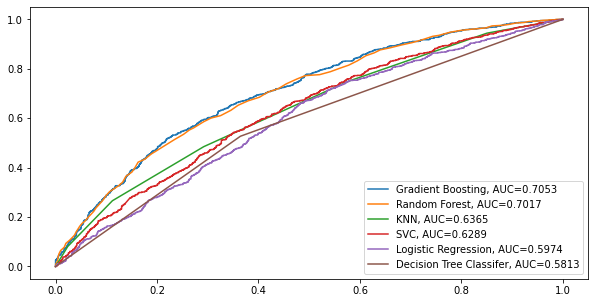

In [81]:
fig = plt.figure()
 
fig.set_figheight(5)
fig.set_figwidth(10)
#fit logistic regression model and plot ROC curve

#fit gradient boosted model and plot ROC curve
model = GradientBoostingClassifier()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Gradient Boosting, AUC="+str(auc))


model = RandomForestClassifier()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Random Forest, AUC="+str(auc))

model = KNeighborsClassifier()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="KNN, AUC="+str(auc))

model = SVC(probability=True)
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="SVC, AUC="+str(auc))

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Logistic Regression, AUC="+str(auc))

model = DecisionTreeClassifier()
model.fit(X_train, y_train)
y_pred = model.predict_proba(X_test)[:, 1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred)
auc = round(metrics.roc_auc_score(y_test, y_pred), 4)
plt.plot(fpr,tpr,label="Decision Tree Classifer, AUC="+str(auc))




#add legend
plt.legend()